# Purpose
- To explore the independent samples t-test and it's assumptions

# Background

To perform null-hypothesis significant testing with the independent sample t-test we need:
- Population parameters to test: $\mu_X$ and $\mu_Y$
- An $H_0$: $d = 0$, where $d$ is estimated by $\hat{d} = \bar{X} - \bar{Y}$, and $\bar{X}$ and $\bar{Y}$ are the sample means
- A test statistic: $t$
- A null distribution for the test statistic: $t \sim t_{df} \sim t_{n_X + n_Y - 2}$, where $n$ is the sample size

The t-test, then, uses the $t$ statistic. This $t$ is derived from:
- Starting from $\bar{X}$ and $\bar{Y}$, the sample means, as statistic
- Since via the central limit theorem, $\bar{X} \sim AN(\mu_X, \frac{\sigma_X^2}{n})$ and $\bar{Y} \sim AN(\mu_Y, \frac{\sigma_Y^2}{n})$ and the Normal distribution being a stable distribution: $\bar{X} - \bar{Y} \sim AN(\mu_X - \mu_Y,\frac{\sigma_X^2}{n} + \frac{\sigma_Y^2}{n})$
- We can re-arrange to get a statistic that is distributed as a Normal with 0 mean and 1 variance (called standardization): $\frac{(\bar{X} - \bar{Y}) - (\mu_X - \mu_Y)}{\sqrt{\frac{\sigma_X^2}{n_X} + \frac{\sigma_Y^2}{n_Y}}} \sim AN(0,1)$
- The differences between population means go away because it's zero under the null hypothesis
- This would be a Z statistic, but there's an issue: most of the times we can't know the population variance $\sigma^2$ so we replace it with the sample variance $S^2$ which is: $S^2 = \frac{\sum\limits_{i=1}^{N}(X_i - \bar{X})^2}{n-1}$
- Now, to this statistic $\frac{(\bar{X} - \bar{Y})}{\sqrt{\frac{S_X^2}{n_X} + \frac{S_Y^2}{n_Y}}} \sim AN(0,1)$ we call $t$ and it's parametrized with the degrees of freedom $df$. Note that the formula shown here is not for the pooled variance, but for the corrected method for unequal variances.
- These degrees of freedom depend only on the sample size $n$ (assuming equal variances, otherwise they depend also on the variances) and are equal to $df = n_x + n_y - 2 $ instead of just $n$ because for the $t$ statistic we must "use" one $df$ to calculate the sample mean $\bar{X}$ in order to estimate $S$ (basically $t$ is actually a function of 2 random variables, $S$ and $\bar{X}$)
- The additional randomness given by the 2 random variables makes $t$ follow a similar distribution as $Z$ but with longer tails
- We call this distribution, the $t$ distribution and it's the null distribution used for the t-test

# Import packages

In [1]:
using Pkg
Pkg.status()

Status `D:\Utilizador HDD\Google Drive\02-Projects\Notebooks-Research\Statistics\Project.toml`
  [a93c6f00] DataFrames v1.6.1
  [31c24e10] Distributions v0.25.108
  [09f84164] HypothesisTests v0.11.0
  [91a5bcdd] Plots v1.40.4
  [f3b207a7] StatsPlots v0.15.7


In [2]:
using Random
using Distributions
using Plots.PlotMeasures
using StatsPlots
using DataFrames
using Printf
using HypothesisTests

# t-test

## Create 2 datasets that are slightly different

In [35]:
Random.seed!(1)

μₓ = 50
σₓ = 10
sample_size_x = 50

model = Normal(μₓ, σₓ)
x = rand(model, sample_size_x)

display(mean(x))

48.41052252529351

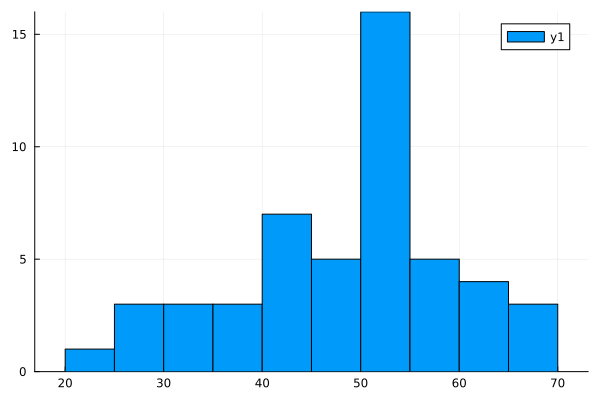

In [15]:
histogram(x, bins=10)

In [36]:
Random.seed!(2)

μᵧ = 45
σᵧ = 10
sample_size_y = 50

model = Normal(μᵧ, σᵧ)
y = rand(model, sample_size_y)

display(mean(y))

42.85679114699676

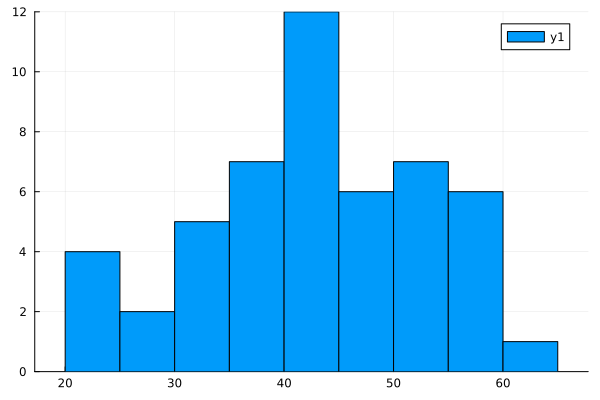

In [17]:
histogram(y, bins=10)

# By package

In [18]:
display("t-test via a package")
ttest = EqualVarianceTTest(x, y)
display(ttest)

"t-test via a package"

Two sample t-test (equal variance)
----------------------------------
Population details:
    parameter of interest:   Mean difference
    value under h_0:         0
    point estimate:          5.55373
    95% confidence interval: (1.376, 9.732)

Test summary:
    outcome with 95% confidence: reject h_0
    two-sided p-value:           0.0097

Details:
    number of observations:   [50,50]
    t-statistic:              2.6379110860218637
    degrees of freedom:       98
    empirical standard error: 2.105351999059272


# By Hand

## Calculate the t-statistic

In [38]:
# calculate parameters for x
nₓ = sample_size_x
X̄ = sum(x) / nₓ
S²ₓ = (sum((x .- X̄).^2)) / (nₓ - 1)

# calculate parameters for y
nᵧ = sample_size_y
Ȳ = sum(y) / nᵧ
S²ᵧ = (sum((y .- Ȳ).^2)) / (nᵧ - 1)

S²ₚ = ((nₓ-1) / (nₓ+nᵧ-2))S²ₓ + ((nᵧ-1) / (nₓ+nᵧ-2))S²ᵧ
t = (X̄ - Ȳ) / √(S²ₚ*((1/nₓ) + (1/nᵧ)))

2.6379110860218637

In [39]:
df = nₓ + nᵧ - 2

model = TDist(df)
pval_2sided = (1-cdf(model, abs(t)) + cdf(model, -abs(t)))  # The area under the t-distribution that is more extreme than t, given that we didn't know the directionality of t at H0 (2-sided test)

0.009703054776364795

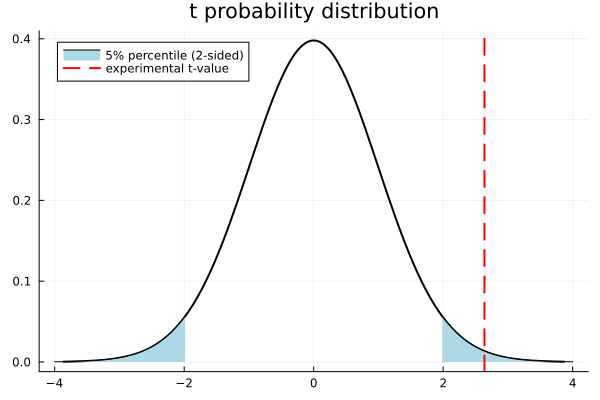

In [32]:
plot(model, lc=:black, lw=2, title="t probability distribution", primary=false)

α = 0.05  # the value at which we consider significance
q_α = quantile(model, α/2)  # this is the value of t at which the probability is less than or equal to the α. We divide α by 2 to perform a 2-sided test 

x1 = range(-4, q_α, length=50) 
x2 = range(-q_α, 4, length=50)

y1 = pdf.(model, x1)
y2 = pdf.(model, x2)

plot!(x1, y1, fillrange=0, fc=:blues, lc=:black, primary=false)
plot!(x2, y2, fillrange=0, fc=:blues, lc=:black, label="5% percentile (2-sided)")

vline!([t], lw=2, ls=:dash, lc=:red, label="experimental t-value")

In [3]:
Random.seed!(1)

TaskLocalRNG()

In [32]:
"""
Compute a 2-sample t-test and plot the computed t statistic in the t distribution

μₓ - the real population mean of the first sample
μᵧ - the real population mean of the second sample
σₓ - the real population variance of the first sample
σᵧ - the real population variance of the second sample
nₓ - the sample size of the first sample
nᵧ - the sample size of the second sample
α - the value at which we consider statistical significance
"""
function calculate_and_plot_t(μₓ::Real, μᵧ::Real,  σₓ::Real, σᵧ::Real, nₓ::Real, nᵧ::Real; α::Real=0.05, n_simulations::Real=100)

    df = nₓ + nᵧ - 2
    model = TDist(df)

    pval_2sided_list = []
    t_list = []
    for i in range(0, n_simulations)
        ######## Sample from the population ########
        modelₓ = Normal(μₓ, σₓ)
        x = rand(modelₓ, nₓ)

        modelᵧ = Normal(μᵧ, σᵧ)
        y = rand(modelᵧ, nᵧ)

        ######## Calculate statistics ########
        # calculate parameters for x
        X̄ = sum(x) / nₓ
        S²ₓ = (sum((x .- X̄).^2)) / (nₓ - 1)

        # calculate parameters for y
        Ȳ = sum(y) / nᵧ
        S²ᵧ = (sum((y .- Ȳ).^2)) / (nᵧ - 1)

        S²ₚ = ((nₓ-1) / (nₓ+nᵧ-2))S²ₓ + ((nᵧ-1) / (nₓ+nᵧ-2))S²ᵧ
        t = (X̄ - Ȳ) / √(S²ₚ*((1/nₓ) + (1/nᵧ)))

        append!(t_list, t)

        pval_2sided = (1 - cdf(model, abs(t)) + cdf(model, -abs(t)))  # The area under the t-distribution that is more extreme than t, given that we didn't know the directionality of t at H0 (2-sided test)
        append!(pval_2sided_list, pval_2sided)
    end


    ######## Plot the t values ########
    plt_t = histogram(
        t_list,
        bins=Int(n_simulations / 2),
        normalize=:pdf,
        color=:orange,
        lw=0,
        label="calculated t values"
    )

    plot!(
        model,
        lc=:black,
        lw=2,
        title="t probability distribution",
        primary=false,
        grid=false
    )

    q_α = quantile(model, α / 2)  # this is the value of t at which the probability is less than or equal to the α. We divide α by 2 to perform a 2-sided test 

    x1 = range(-4, q_α, length=50)
    x2 = range(-q_α, 4, length=50)

    y1 = pdf.(model, x1)
    y2 = pdf.(model, x2)

    plot!(x1, y1, fillrange=0, fc=:blues, lc=:black, primary=false)
    plot!(x2, y2, fillrange=0, fc=:blues, lc=:black, label="5% percentile (2-sided)")

    # vline!([t], lw=2, ls=:dash, lc=:red, label="experimental t-value")

    ######## Plot the t values ########
    plt_pval = density(
        pval_2sided_list,
        trim=true,
        lc=:black,
        lw=2,
        xlims=(0, maximum([pval_2sided_list; [α]])),
        yaxis=false,
        grid=false,
        label="p-values",
        title="p-value distribution",
    )

    vline!(
        [median(pval_2sided_list)],
        lw=3,
        ls=:dash,
        lc=:black,
        label="percentile 50 of calculated p-values"
    )

    vline!(
        [α],
        lw=3,
        ls=:dash,
        lc=:blues,
        label="α"
    )

    ######## Display stuff ########
    plot(
        plt_t,
        plt_pval,
        layout=(1, 2),
        size=(1000, 400)
    )

end

calculate_and_plot_t

In [24]:
"""
Compute a 2-sample welch t-test and plot the computed t statistic in the t distribution

μₓ - the real population mean of the first sample
μᵧ - the real population mean of the second sample
σₓ - the real population variance of the first sample
σᵧ - the real population variance of the second sample
nₓ - the sample size of the first sample
nᵧ - the sample size of the second sample
α - the value at which we consider statistical significance
"""
function calculate_and_plot_welch_t(μₓ::Real, μᵧ::Real,  σₓ::Real, σᵧ::Real, nₓ::Real, nᵧ::Real; α::Real=0.05, n_simulations::Real=100)

    pval_2sided_list = []
    t_list = []
    for i in range(0, n_simulations)
        ######## Sample from the population ########
        modelₓ = Normal(μₓ, σₓ)
        x = rand(modelₓ, nₓ)

        modelᵧ = Normal(μᵧ, σᵧ)
        y = rand(modelᵧ, nᵧ)

        ######## Calculate statistics ########
        # calculate parameters for x
        X̄ = sum(x) / nₓ
        S²ₓ = (sum((x .- X̄).^2)) / (nₓ - 1)

        # calculate parameters for y
        Ȳ = sum(y) / nᵧ
        S²ᵧ = (sum((y .- Ȳ).^2)) / (nᵧ - 1)

        t = (X̄ - Ȳ) / √((S²ₓ/nₓ) + (S²ᵧ/nᵧ))  # The denominator is one of the major differences between Welch and normal t-test

        append!(t_list, t)

        df = ((S²ₓ/nₓ) + (S²ᵧ/nᵧ))^2 / (((S²ₓ/nₓ)^2 / (nₓ-1)) + ((S²ᵧ/nᵧ)^2 / (nᵧ-1)))  # The other of the major differences between Welch and normal t-test
        model = TDist(df)

        pval_2sided = (1 - cdf(model, abs(t)) + cdf(model, -abs(t)))  # The area under the t-distribution that is more extreme than t, given that we didn't know the directionality of t at H0 (2-sided test)
        append!(pval_2sided_list, pval_2sided)
    end

    # Calculate a population-level model just for plotting
    df = ((σₓ^2/nₓ) + (σᵧ^2/nᵧ))^2 / (((σₓ^2/nₓ)^2 / (nₓ-1)) + ((σᵧ^2/nᵧ)^2 / (nᵧ-1)))
    model = TDist(df)

    ######## Plot the t values ########
    plt_t = histogram(
        t_list,
        bins=Int(n_simulations / 2),
        normalize=:pdf,
        color=:orange,
        lw=0,
        label="calculated t values"
    )

    plot!(
        model,
        lc=:black,
        lw=2,
        title="t probability distribution",
        primary=false,
        grid=false
    )

    q_α = quantile(model, α / 2)  # this is the value of t at which the probability is less than or equal to the α. We divide α by 2 to perform a 2-sided test 

    x1 = range(-4, q_α, length=50)
    x2 = range(-q_α, 4, length=50)

    y1 = pdf.(model, x1)
    y2 = pdf.(model, x2)

    plot!(x1, y1, fillrange=0, fc=:blues, lc=:black, primary=false)
    plot!(x2, y2, fillrange=0, fc=:blues, lc=:black, label="5% percentile (2-sided)")

    # vline!([t], lw=2, ls=:dash, lc=:red, label="experimental t-value")

    ######## Plot the t values ########
    plt_pval = density(
        pval_2sided_list,
        trim=true,
        lc=:black,
        lw=2,
        xlims=(0, maximum([pval_2sided_list; [α]])),
        yaxis=false,
        grid=false,
        label="p-values",
        title="p-value distribution",
    )

    vline!(
        [median(pval_2sided_list)],
        lw=3,
        ls=:dash,
        lc=:black,
        label="percentile 50 of calculated p-values"
    )

    vline!(
        [α],
        lw=3,
        ls=:dash,
        lc=:blues,
        label="α"
    )

    ######## Display stuff ########
    plot(
        plt_t,
        plt_pval,
        layout=(1, 2),
        size=(1000, 400)
    )

end

calculate_and_plot_welch_t

# Explore differences in sample size

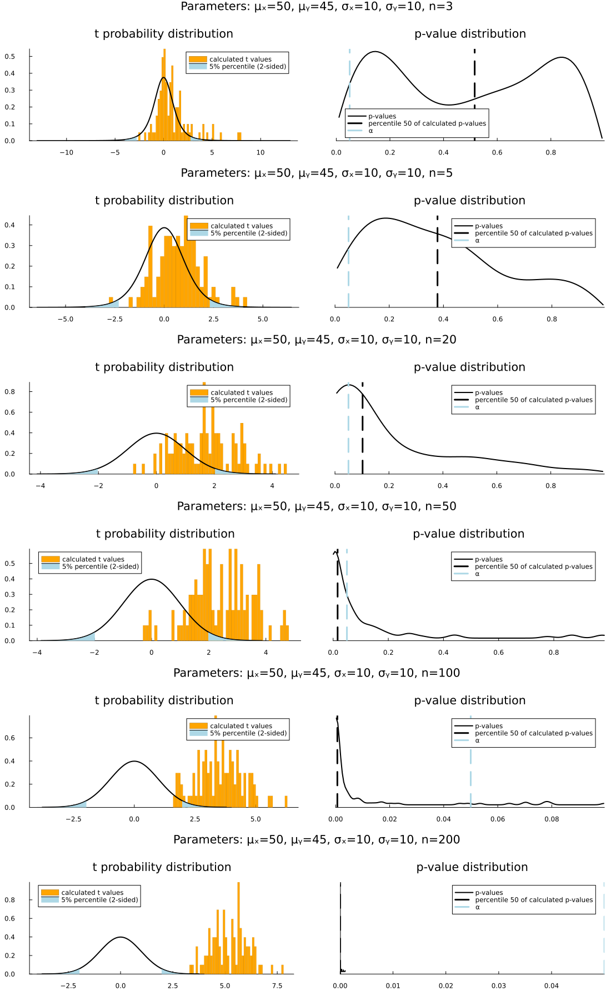

In [33]:
# Change these variables
μₓ = 50  # the real population mean for sample x
μᵧ = 45  # the real population mean for sample y
σₓ = 10  # the real population variance for sample x
σᵧ = 10  # the real population variance for sample y
n_list = [3, 5, 20, 50, 100, 200]  # the sample size
α = 0.05

plt_array = []
for n in n_list
    title = plot(title = @sprintf("Parameters: μₓ=%s, μᵧ=%s, σₓ=%s, σᵧ=%s, n=%s", μₓ, μᵧ, σₓ, σᵧ, n), grid = false, showaxis = false, bottom_margin = -50Plots.px)
    plt = plot(
        title,
        calculate_and_plot_t(μₓ, μᵧ, σₓ, σᵧ, n, n; α),
        layout=@layout([a{0.10h}; grid(1,1)])
    )
    push!(plt_array, plt)
end

plot(
    plt_array...,
    layout=(length(n_list), 1),
    size=(1100, 300*length(n_list)),
    bg="white",
    left_margin=5mm
)

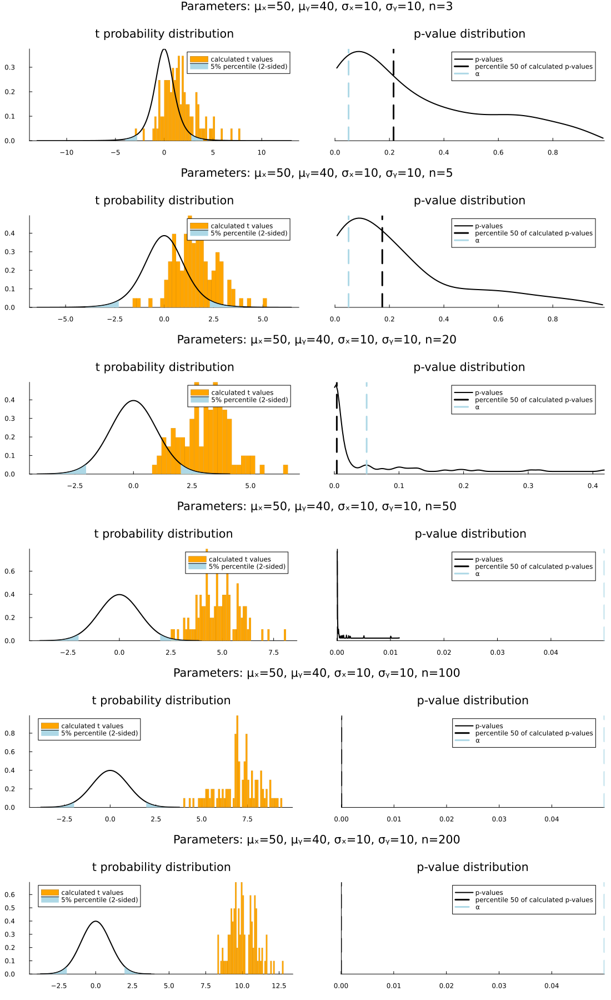

In [40]:
# Change these variables
μₓ = 50  # the real population mean for sample x
μᵧ = 40  # the real population mean for sample y
σₓ = 10  # the real population variance for sample x
σᵧ = 10  # the real population variance for sample y
n_list = [3, 5, 20, 50, 100, 200]  # the sample size
α = 0.05

plt_array = []
for n in n_list
    title = plot(title = @sprintf("Parameters: μₓ=%s, μᵧ=%s, σₓ=%s, σᵧ=%s, n=%s", μₓ, μᵧ, σₓ, σᵧ, n), grid = false, showaxis = false, bottom_margin = -50Plots.px)
    plt = plot(
        title,
        calculate_and_plot_t(μₓ, μᵧ, σₓ, σᵧ, n, n; α),
        layout=@layout([a{0.10h}; grid(1,1)])
    )
    push!(plt_array, plt)
end

plot(
    plt_array...,
    layout=(length(n_list), 1),
    size=(1100, 300*length(n_list)),
    bg="white",
    left_margin=5mm
)

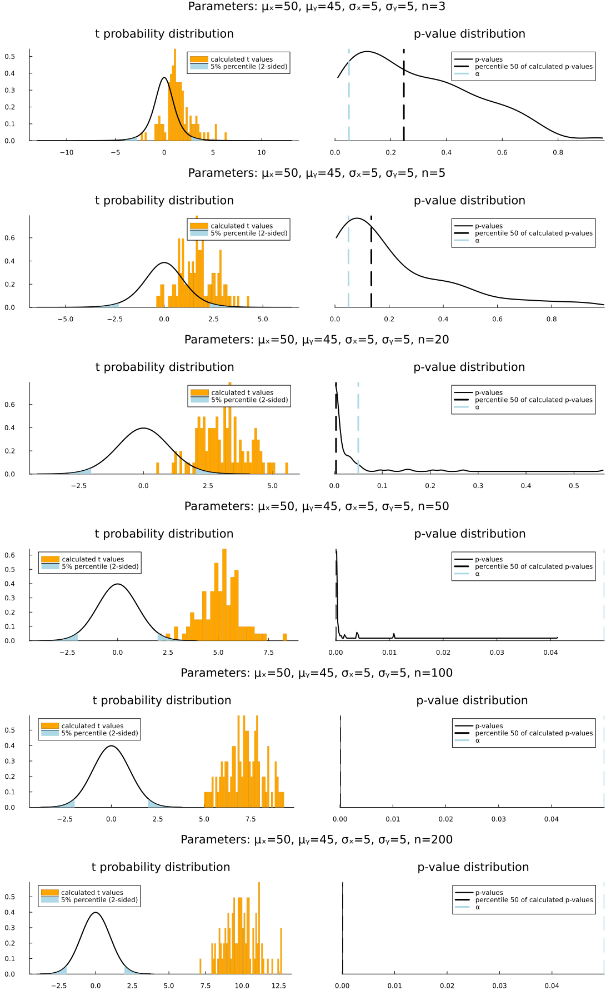

In [41]:
# Change these variables
μₓ = 50  # the real population mean for sample x
μᵧ = 45  # the real population mean for sample y
σₓ = 5  # the real population variance for sample x
σᵧ = 5  # the real population variance for sample y
n_list = [3, 5, 20, 50, 100, 200]  # the sample size
α = 0.05

plt_array = []
for n in n_list
    title = plot(title = @sprintf("Parameters: μₓ=%s, μᵧ=%s, σₓ=%s, σᵧ=%s, n=%s", μₓ, μᵧ, σₓ, σᵧ, n), grid = false, showaxis = false, bottom_margin = -50Plots.px)
    plt = plot(
        title,
        calculate_and_plot_t(μₓ, μᵧ, σₓ, σᵧ, n, n; α),
        layout=@layout([a{0.10h}; grid(1,1)])
    )
    push!(plt_array, plt)
end

plot(
    plt_array...,
    layout=(length(n_list), 1),
    size=(1100, 300*length(n_list)),
    bg="white",
    left_margin=5mm
)

# Explore differences in fold-changes

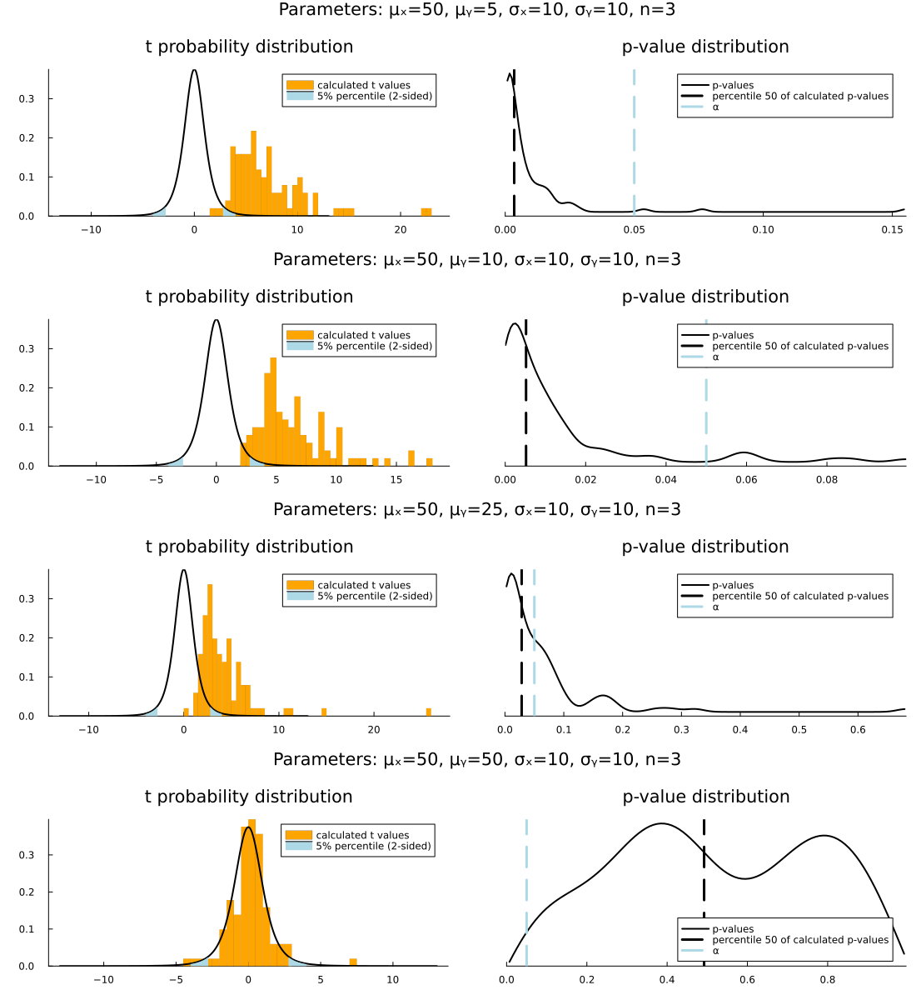

In [42]:
# Change these variables
μₓ = 50  # the real population mean for sample x
μᵧ_list = [5, 10, 25, 50]  # the real population mean for sample y
σₓ = 10  # the real population variance for sample x
σᵧ = 10  # the real population variance for sample y
n = 3  # the sample size
α = 0.05

plt_array = []
for μᵧ in μᵧ_list
    title = plot(title = @sprintf("Parameters: μₓ=%s, μᵧ=%s, σₓ=%s, σᵧ=%s, n=%s", μₓ, μᵧ, σₓ, σᵧ, n), grid = false, showaxis = false, bottom_margin = -50Plots.px)
    plt = plot(
        title,
        calculate_and_plot_t(μₓ, μᵧ, σₓ, σᵧ, n, n; α),
        layout=@layout([a{0.10h}; grid(1,1)])
    )
    push!(plt_array, plt)
end

plot(
    plt_array...,
    layout=(length(μᵧ_list), 1),
    size=(1100, 300*length(μᵧ_list)),
    bg="white",
    left_margin=5mm
)

# Explore differences in variance (noise, uncertainty, etc)

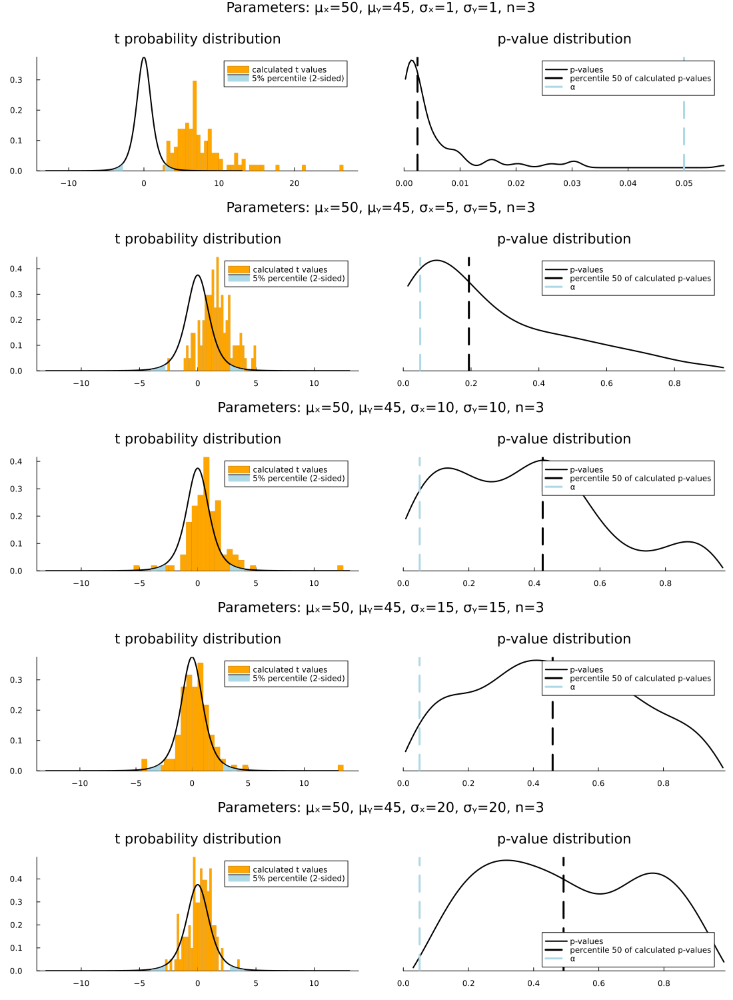

In [44]:
# Change these variables
μₓ = 50  # the real population mean for sample x
μᵧ = 45  # the real population mean for sample y
σ_list = [1, 5, 10, 15, 20]  # the real population variance for both samples
n = 3  # the sample size
α = 0.05

plt_array = []
for σ in σ_list
    title = plot(title = @sprintf("Parameters: μₓ=%s, μᵧ=%s, σₓ=%s, σᵧ=%s, n=%s", μₓ, μᵧ, σ, σ, n), grid = false, showaxis = false, bottom_margin = -50Plots.px)
    plt = plot(
        title,
        calculate_and_plot_t(μₓ, μᵧ, σ, σ, n, n; α),
        layout=@layout([a{0.10h}; grid(1,1)])
    )
    push!(plt_array, plt)
end

plot(
    plt_array...,
    layout=(length(σ_list), 1),
    size=(1100, 300*length(σ_list)),
    bg="white",
    left_margin=5mm
)

# Explore the t-test when both samples' variances are unequal

## Same population means

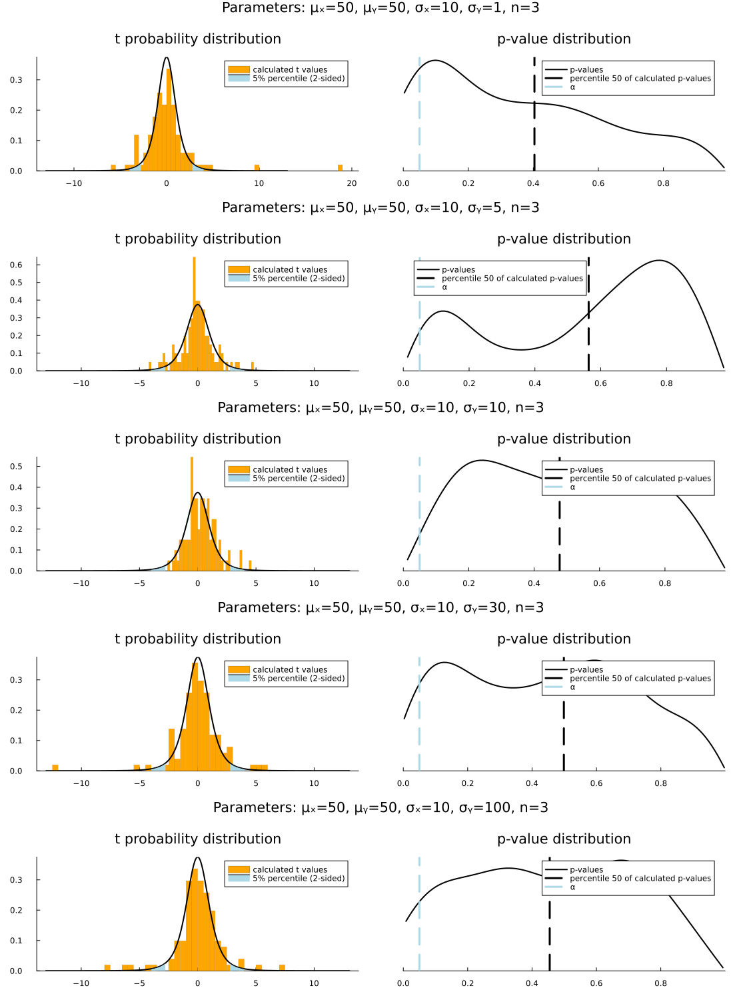

In [45]:
# Change these variables
μₓ = 50  # the real population mean for sample x
μᵧ = 50  # the real population mean for sample y
σₓ = 10
σ_list = [1, 5, 10, 30, 100]  # the real population variance for both samples
n = 3  # the sample size
α = 0.05

plt_array = []
for σ in σ_list
    title = plot(title = @sprintf("Parameters: μₓ=%s, μᵧ=%s, σₓ=%s, σᵧ=%s, n=%s", μₓ, μᵧ, σₓ, σ, n), grid = false, showaxis = false, bottom_margin = -50Plots.px)
    plt = plot(
        title,
        calculate_and_plot_t(μₓ, μᵧ, σₓ, σ, n, n; α),
        layout=@layout([a{0.10h}; grid(1,1)])
    )
    push!(plt_array, plt)
end

plot(
    plt_array...,
    layout=(length(σ_list), 1),
    size=(1100, 300*length(σ_list)),
    bg="white",
    left_margin=5mm
)

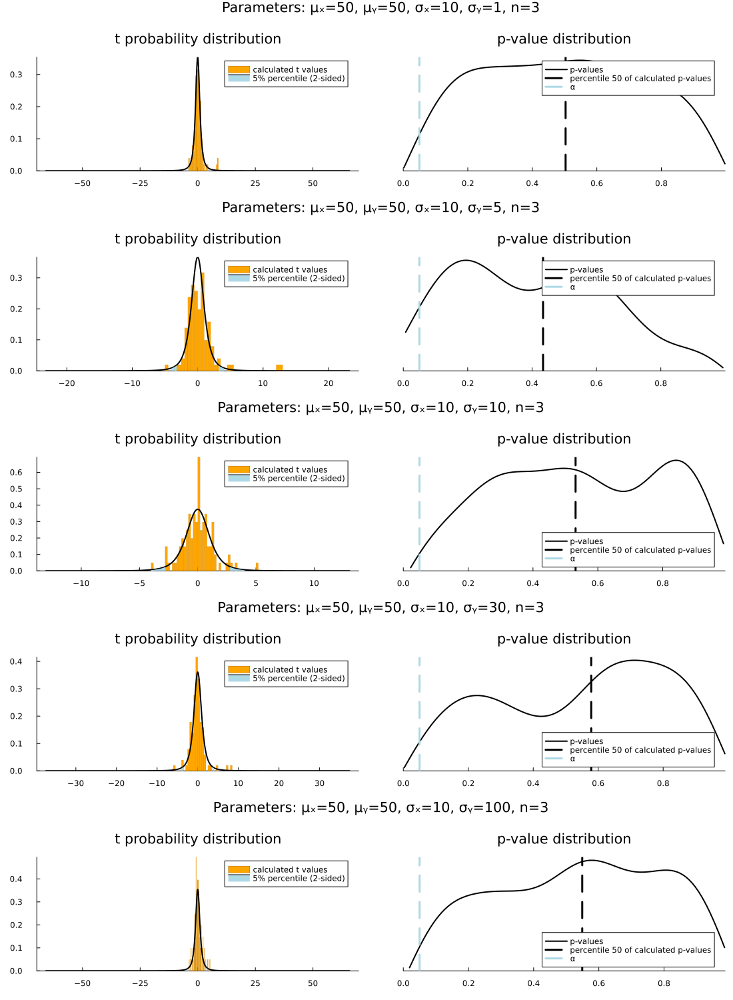

In [26]:
# Change these variables
μₓ = 50  # the real population mean for sample x
μᵧ = 50  # the real population mean for sample y
σₓ = 10
σ_list = [1, 5, 10, 30, 100]  # the real population variance for both samples
n = 3  # the sample size
α = 0.05

plt_array = []
for σ in σ_list
    title = plot(title = @sprintf("Parameters: μₓ=%s, μᵧ=%s, σₓ=%s, σᵧ=%s, n=%s", μₓ, μᵧ, σₓ, σ, n), grid = false, showaxis = false, bottom_margin = -50Plots.px)
    plt = plot(
        title,
        calculate_and_plot_welch_t(μₓ, μᵧ, σₓ, σ, n, n; α),
        layout=@layout([a{0.10h}; grid(1,1)])
    )
    push!(plt_array, plt)
end

plot(
    plt_array...,
    layout=(length(σ_list), 1),
    size=(1100, 300*length(σ_list)),
    bg="white",
    left_margin=5mm
)

- There does not seem to be an effect for not correcting the fact that the variances are not equal (should have performed a welch t-test in that situation)

## Different population means

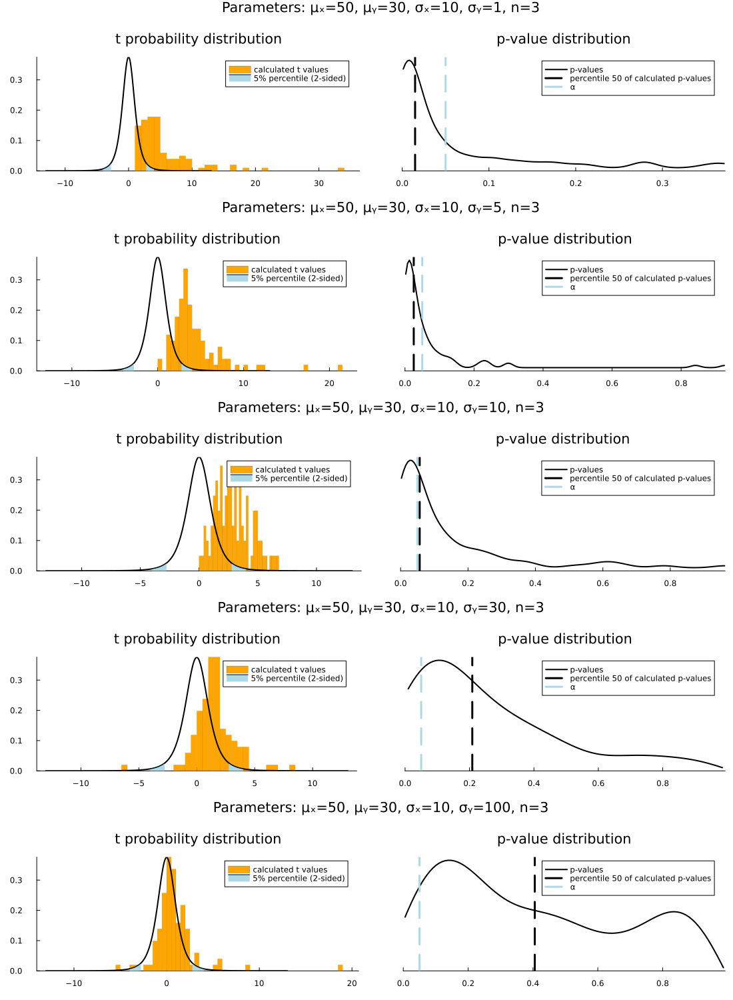

In [46]:
# Change these variables
μₓ = 50  # the real population mean for sample x
μᵧ = 30  # the real population mean for sample y
σₓ = 10
σ_list = [1, 5, 10, 30, 100]  # the real population variance for both samples
n = 3  # the sample size
α = 0.05

plt_array = []
for σ in σ_list
    title = plot(title = @sprintf("Parameters: μₓ=%s, μᵧ=%s, σₓ=%s, σᵧ=%s, n=%s", μₓ, μᵧ, σₓ, σ, n), grid = false, showaxis = false, bottom_margin = -50Plots.px)
    plt = plot(
        title,
        calculate_and_plot_t(μₓ, μᵧ, σₓ, σ, n, n; α),
        layout=@layout([a{0.10h}; grid(1,1)])
    )
    push!(plt_array, plt)
end

plot(
    plt_array...,
    layout=(length(σ_list), 1),
    size=(1100, 300*length(σ_list)),
    bg="white",
    left_margin=5mm
)

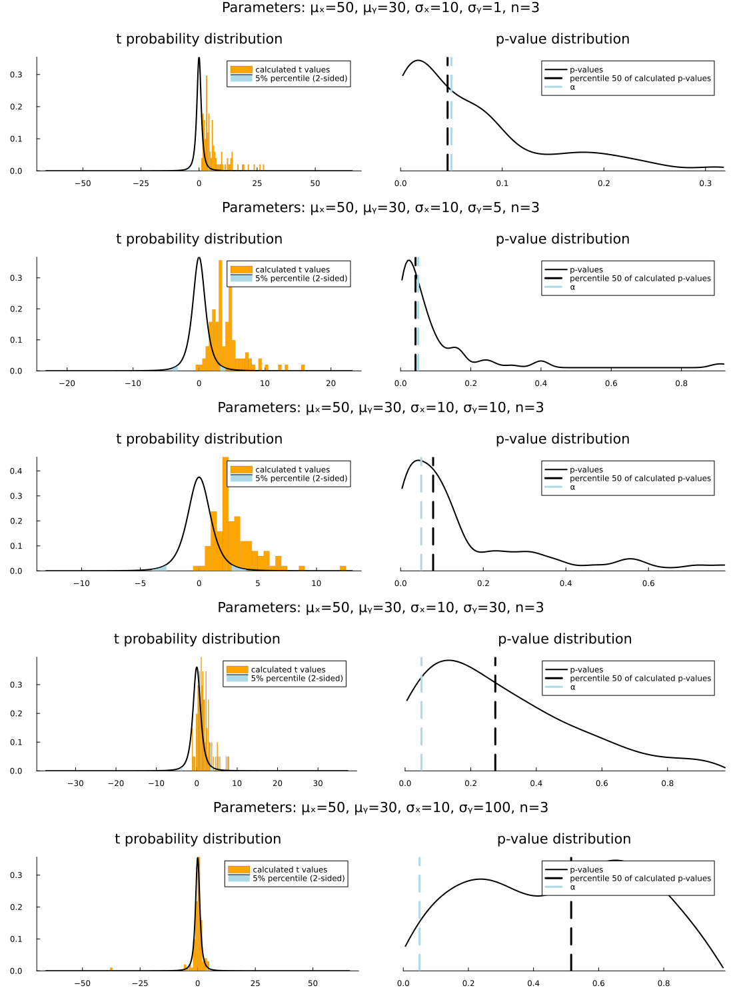

In [25]:
# Change these variables
μₓ = 50  # the real population mean for sample x
μᵧ = 30  # the real population mean for sample y
σₓ = 10
σ_list = [1, 5, 10, 30, 100]  # the real population variance for both samples
n = 3  # the sample size
α = 0.05

plt_array = []
for σ in σ_list
    title = plot(title = @sprintf("Parameters: μₓ=%s, μᵧ=%s, σₓ=%s, σᵧ=%s, n=%s", μₓ, μᵧ, σₓ, σ, n), grid = false, showaxis = false, bottom_margin = -50Plots.px)
    plt = plot(
        title,
        calculate_and_plot_welch_t(μₓ, μᵧ, σₓ, σ, n, n; α),
        layout=@layout([a{0.10h}; grid(1,1)])
    )
    push!(plt_array, plt)
end

plot(
    plt_array...,
    layout=(length(σ_list), 1),
    size=(1100, 300*length(σ_list)),
    bg="white",
    left_margin=5mm
)

- The unequal variance test (Welch) actually did worse... (This is probably just stochastic effects)
- And it seems to have less power (this was expected)

## Different group sizes and variances

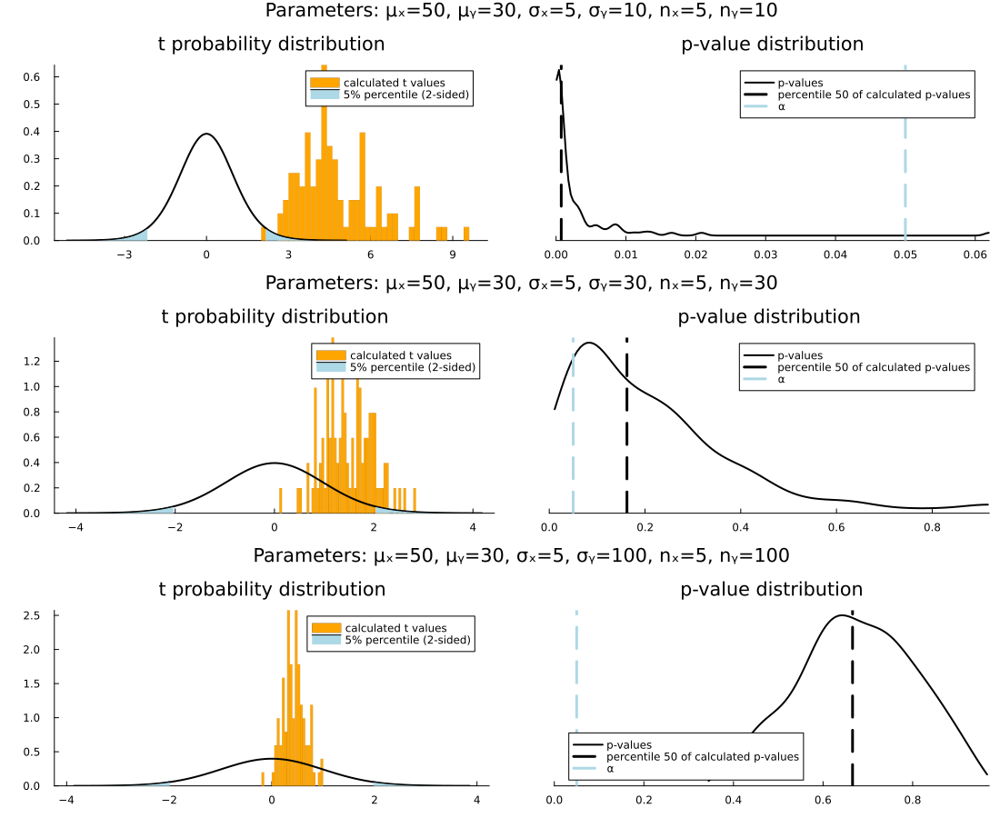

In [48]:
# Change these variables
μₓ = 50  # the real population mean for sample x
μᵧ = 30  # the real population mean for sample y
σₓ = 5
σ_list = [10, 30, 100]  # the real population variance
nₓ = 5  # the sample size
n_list = [10, 30, 100]
α = 0.05

plt_array = []
for (σ, n) in zip(σ_list, n_list)
    title = plot(title = @sprintf("Parameters: μₓ=%s, μᵧ=%s, σₓ=%s, σᵧ=%s, nₓ=%s, nᵧ=%s", μₓ, μᵧ, σₓ, σ, nₓ, n), grid = false, showaxis = false, bottom_margin = -50Plots.px)
    plt = plot(
        title,
        calculate_and_plot_t(μₓ, μᵧ, σₓ, σ, nₓ, n; α),
        layout=@layout([a{0.10h}; grid(1,1)])
    )
    push!(plt_array, plt)
end

plot(
    plt_array...,
    layout=(length(σ_list), 1),
    size=(1100, 300*length(σ_list)),
    bg="white",
    left_margin=5mm
)

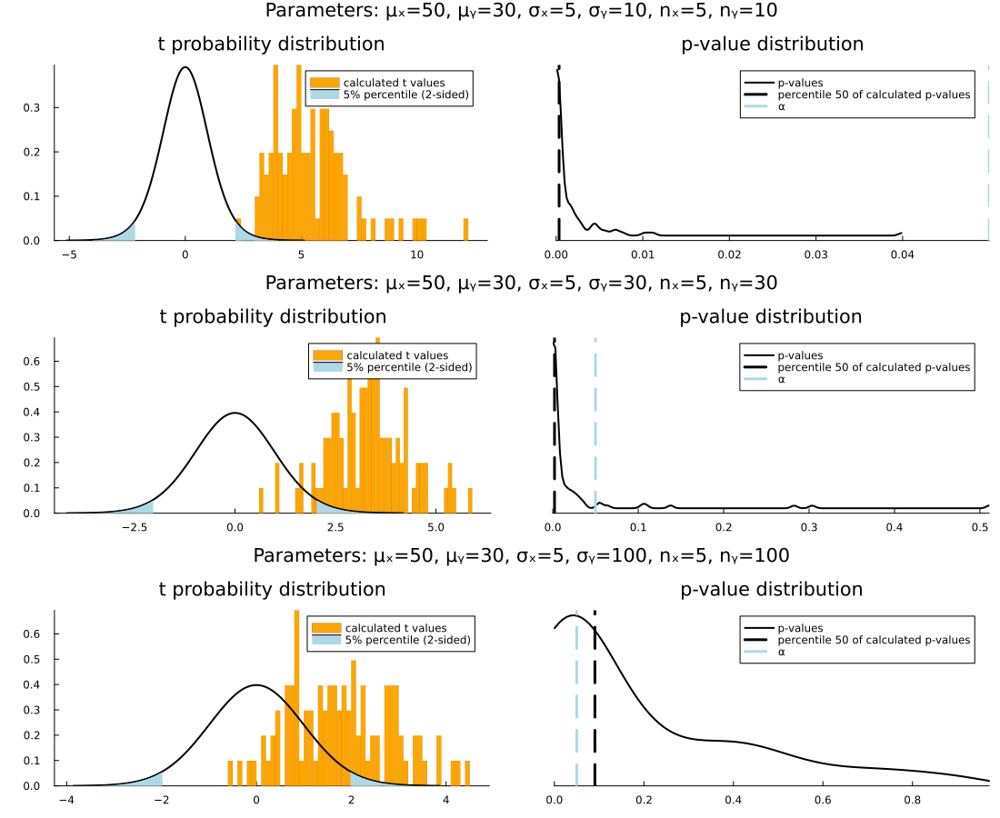

In [49]:
# Change these variables
μₓ = 50  # the real population mean for sample x
μᵧ = 30  # the real population mean for sample y
σₓ = 5
σ_list = [10, 30, 100]  # the real population variance
nₓ = 5  # the sample size
n_list = [10, 30, 100]
α = 0.05

plt_array = []
for (σ, n) in zip(σ_list, n_list)
    title = plot(title = @sprintf("Parameters: μₓ=%s, μᵧ=%s, σₓ=%s, σᵧ=%s, nₓ=%s, nᵧ=%s", μₓ, μᵧ, σₓ, σ, nₓ, n), grid = false, showaxis = false, bottom_margin = -50Plots.px)
    plt = plot(
        title,
        calculate_and_plot_welch_t(μₓ, μᵧ, σₓ, σ, nₓ, n; α),
        layout=@layout([a{0.10h}; grid(1,1)])
    )
    push!(plt_array, plt)
end

plot(
    plt_array...,
    layout=(length(σ_list), 1),
    size=(1100, 300*length(σ_list)),
    bg="white",
    left_margin=5mm
)

- Finally, in the most unequal situations we start to see a huge advantage for the Welch t-test